# Segmentation Metadata Generator

# Install Requirements

In [12]:
!pip install --upgrade 'supervision>0.14' transformers scipy safetensors 'opencv-python-headless<4.8.0' 'opencv-python<4.8.0' --no-dependencies
# accelerate cause error in transformers

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 72 kB 2.3 MB/s eta 0:00:01
  Attempting uninstall: supervision
    Found existing installation: supervision 0.11.1
    Uninstalling supervision-0.11.1:
      Successfully uninstalled supervision-0.11.1
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [2]:
!pip install -q git+https://github.com/IDEA-Research/GroundingDINO.git

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4+1.g536eedd6e requires numpy<1.24,>=1.18, but you have numpy 1.24.3 which is incompatible.
cudf 23.2.0 requires pandas<1.6.0dev0,>=1.0, but you have pandas 2.0.2 which is incompatible.
cudf 23.2.0 requires protobuf==3.20.3, but you have protobuf 4.23.3 which is incompatible.
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [21]:
!mkdir pretrained_checkpoint/
# !wget https://huggingface.co/lkeab/hq-sam/resolve/main/sam_hq_vit_b.pth?download=true -P pretrained_checkpoint/ -O sam_hq_vit_b.pth
# !wget https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth -P pretrained_checkpoint/
!wget https://raw.githubusercontent.com/IDEA-Research/Grounded-Segment-Anything/main/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py -P pretrained_checkpoint/

mkdir: cannot create directory ‘pretrained_checkpoint/’: File exists


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


--2023-11-11 04:20:11--  https://raw.githubusercontent.com/IDEA-Research/Grounded-Segment-Anything/main/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


HTTP request sent, awaiting response... 200 OK
Length: 1006 [text/plain]
Saving to: ‘pretrained_checkpoint/GroundingDINO_SwinT_OGC.py.1’

GroundingDINO_SwinT 100%[===================>]    1006  --.-KB/s    in 0s      

2023-11-11 04:20:12 (79.4 MB/s) - ‘pretrained_checkpoint/GroundingDINO_SwinT_OGC.py.1’ saved [1006/1006]



# Initialize

In [1]:
import torch
import json
import os
import cv2
import numpy as np
from tqdm.notebook import tqdm
import supervision as sv

from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.amg import (
    mask_to_rle_pytorch
)

sam_checkpoint = "./pretrained_checkpoint/sam_hq_vit_b.pth"
model_type = "vit_b"
device = torch.device("cpu")
if torch.cuda.is_available():
   device = torch.device("cuda:0")

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
sam_predictor = SamPredictor(sam)

DATASET_ROOT = "/media/haritsahm/MainStorage/datasets/"

dataset_dir = os.path.join(DATASET_ROOT, "kourai-data/TestSAM/data/")
sample_image = os.path.join(DATASET_ROOT, "kourai-data/TestSAM/data/video-2Xx7yCWSn2tqsutuJ-frame-001989-5pN94xJ46yBY7Cbf3.jpg")
original_metatada = os.path.join(DATASET_ROOT, "kourai-data/TestSAM/index.json")

with open(os.path.join(DATASET_ROOT, "kourai-data/TestSAM/index.json"), "r") as f:
    og_metadata = json.load(f)

<All keys matched successfully>


# Generating Polygons Using SAM-HQ

In [54]:
extended_metadata = {}
for frame in tqdm(og_metadata['frames'][:10], total=10):
    videoMetadata = frame['videoMetadata']

    image_path = f'video-{videoMetadata["videoId"]}-frame-{videoMetadata["frameIndex"]:06d}-{frame["datasetFrameId"]}.jpg'
    extended_metadata[frame["datasetFrameId"]] = {
        "image_path": image_path,
        "annotations": {}
    }
    image_path = os.path.join(dataset_dir, image_path)

    image_np = cv2.imread(image_path)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    image_shape = image_np.shape[:2]

    sam_predictor.set_image(image_np)

    annotations = frame['annotations']
    generated_metadata = {
        "boxes": {}, # xywh
        "polygons": {}, # xy,xy
    }
    for idx, ann in enumerate(annotations):
        use_box_center = False
        if "labels" in ann:
            if ann["labels"][0] == "head":
                use_box_center = True
        if "boundingBox" in ann:
            box = ann["boundingBox"]
            x = int(box["x"])
            y = int(box["y"])
            w = int(box["w"])
            h = int(box["h"])

            transformed_points = None
            point_labels = None
            if False:
                transformed_points = torch.tensor([[x+w/2, y+h/2]], device=device)
                transformed_points = sam_predictor.transform.apply_coords_torch(transformed_points, (1024, 1024))
                point_labels = torch.ones(transformed_points.shape[0])
                transformed_points, point_labels = transformed_points[None, :, :], point_labels[None, :]


            input_box = torch.tensor([[x, y, x+w, y+h]], device=device)
            transformed_box = sam_predictor.transform.apply_boxes_torch(input_box, image_shape)
            masks, _, _ = sam_predictor.predict_torch(
                point_coords=transformed_points,
                point_labels=point_labels,
                boxes=transformed_box,
                multimask_output=False,
                hq_token_only=False,
            )
            masks = masks.squeeze().detach().cpu().numpy() # [H,W]
            polygons = sv.mask_to_polygons(masks) # [np.ndarray([N, 2])]
            if len(polygons) > 0:
                polygons = polygons[0].tolist() # [(x,y), (x,y)]
            else:
                polygons = []
            generated_metadata["boxes"][idx] = [x, y, w, h]
            generated_metadata["polygons"][idx] = polygons

    extended_metadata[frame["datasetFrameId"]]["annotations"] = generated_metadata


  0%|          | 0/10 [00:00<?, ?it/s]

## Display Polygons

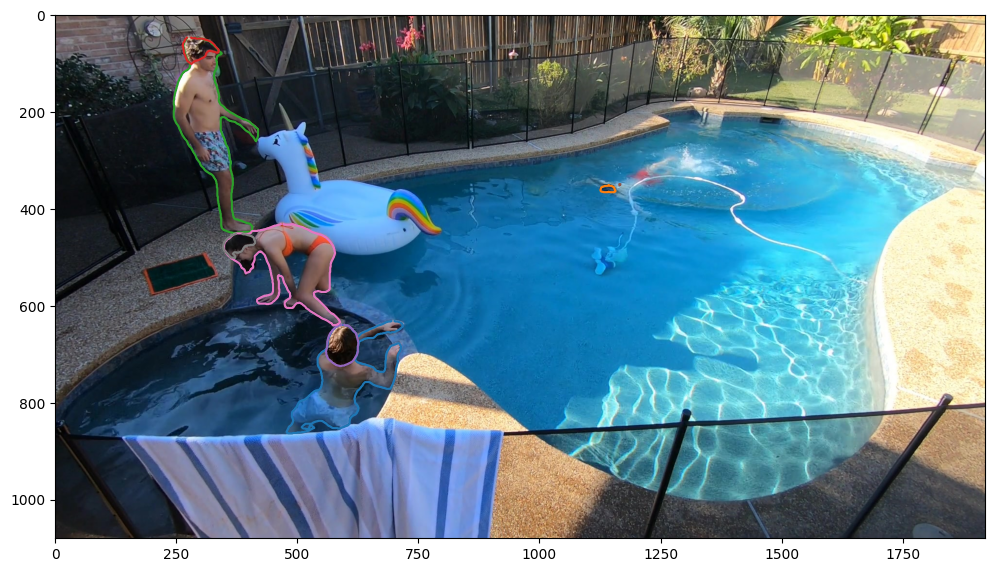

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

for k, v in extended_metadata.items():
    image_np = cv2.imread(os.path.join(dataset_dir, v['image_path']))
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    plt.imshow(image_np)
    for p_idx, p_data  in v["annotations"]["polygons"].items():
        if len(p_data) > 0:
            xs, ys = zip(*p_data)
            plt.plot(xs,ys) 
    break
plt.show() # if you need...


## Generating Mask from Polygon

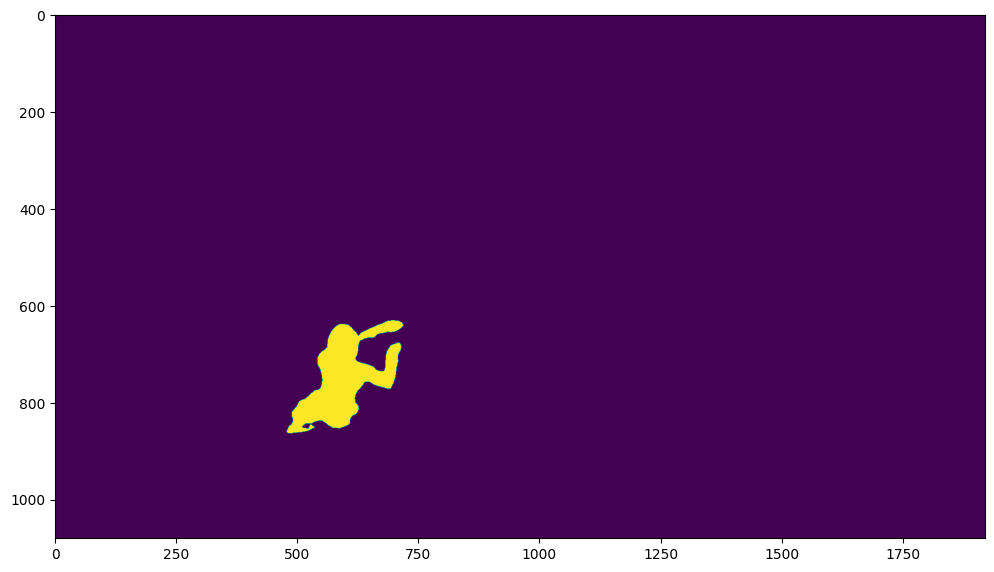

In [56]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 8))

for k, v in extended_metadata.items():
    image_np = cv2.imread(os.path.join(dataset_dir, v['image_path']))
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    h, w = image_np.shape[:2]
    for p_idx, p_data  in v["annotations"]["polygons"].items():
        gen_mask = sv.polygon_to_mask(np.asarray(p_data), (w,h))
        break
    break
plt.imshow(gen_mask)
plt.show() # if you need...


## Generating Boxes from Polygons

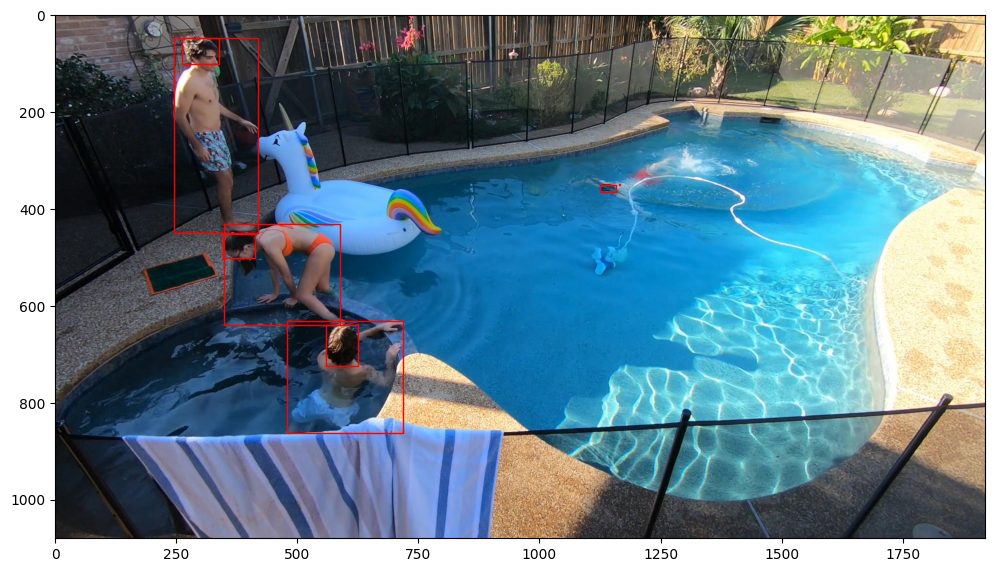

In [58]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

fig, ax = plt.subplots(figsize=(12, 8))

for k, v in extended_metadata.items():
    image_np = cv2.imread(os.path.join(dataset_dir, v['image_path']))
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    ax.imshow(image_np)

    for p_idx, p_data  in v["annotations"]["polygons"].items():
        xyxy = sv.polygon_to_xyxy(np.asarray(p_data))
        xyxy[2:] -= xyxy[:2]
        xywh = xyxy.tolist()
        rect = patches.Rectangle((xywh[0], xywh[1]), xywh[2], xywh[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    break
plt.show() # if you need...

In [6]:
with open("extended_metadata.json", "w") as outfile: 
    json.dump(extended_metadata, outfile)

# Generating Polygons with Grounded-SAM

In [105]:
# Grounding DINO
import groundingdino.datasets.transforms as T
from groundingdino.util.inference import load_image, Model

import supervision as sv

ckpt_filenmae = "pretrained_checkpoint/groundingdino_swint_ogc.pth"
ckpt_config_filename = "pretrained_checkpoint/GroundingDINO_SwinT_OGC.py"
SAM_ENCODER_VERSION = "vit_h"
SAM_CHECKPOINT_PATH = "./sam_vit_h_4b8939.pth"


grounding_dino_model = Model(
    model_config_path=ckpt_config_filename,
    model_checkpoint_path=ckpt_filenmae,
    device = "cuda"
)

final text_encoder_type: bert-base-uncased


## Run Detection Pipeline

['person', 'person', 'person']


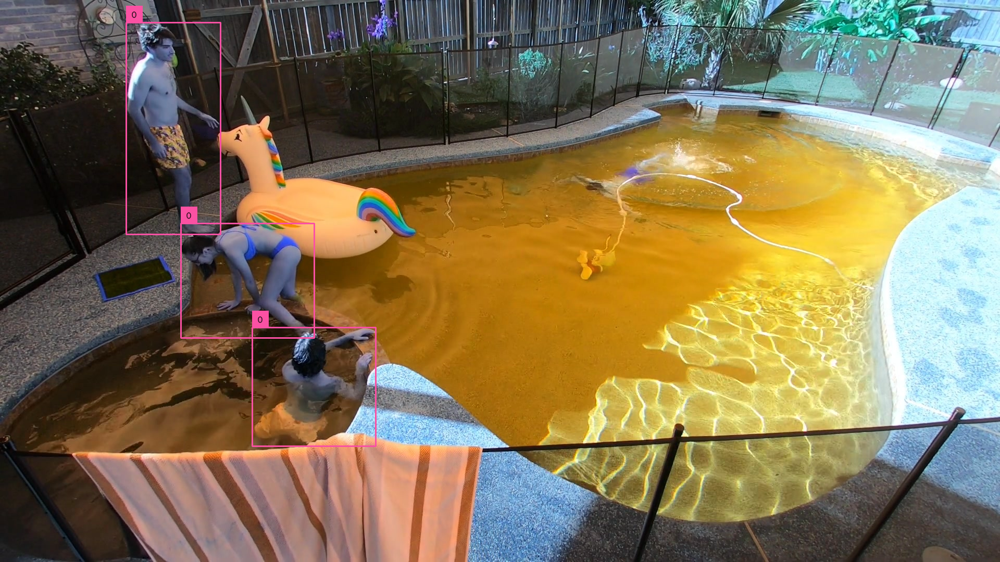

In [106]:
from PIL import Image

TEXT_PROMPT = "person"
BOX_THRESHOLD = 0.245
TEXT_THRESHOLD = 0.287

# load image
image = cv2.imread(sample_image)
image_np, image_pt = load_image(sample_image)
sam_predictor.set_image(image_np)

# detect objects
detections, phrases = grounding_dino_model.predict_with_caption(
    image=image_np,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold=BOX_THRESHOLD
)
print(phrases)
class_id = Model.phrases2classes(phrases=phrases, classes=[TEXT_PROMPT])
detections.class_id = class_id

box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()
annotated_image = box_annotator.annotate(scene=image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=[TEXT_PROMPT])

Image.fromarray(annotated_image)

## Run Segmentation Pipeline

In [107]:
# box: normalized box xywh -> unnormalized xyxy
import torch

boxes_xyxy = torch.Tensor(detections.xyxy)
transformed_boxes = sam_predictor.transform.apply_boxes_torch(boxes_xyxy, image_np.shape[:2]).to(device)
masks, _, _ = sam_predictor.predict_torch(
            point_coords = None,
            point_labels = None,
            boxes = transformed_boxes,
            multimask_output = False,
        )

mask_annotator = sv.MaskAnnotator()

if isinstance(masks, torch.Tensor):
    masks = masks.cpu().numpy().squeeze(1)
detections.mask = masks

annotated_image = mask_annotator.annotate(scene=annotated_image, detections=detections)


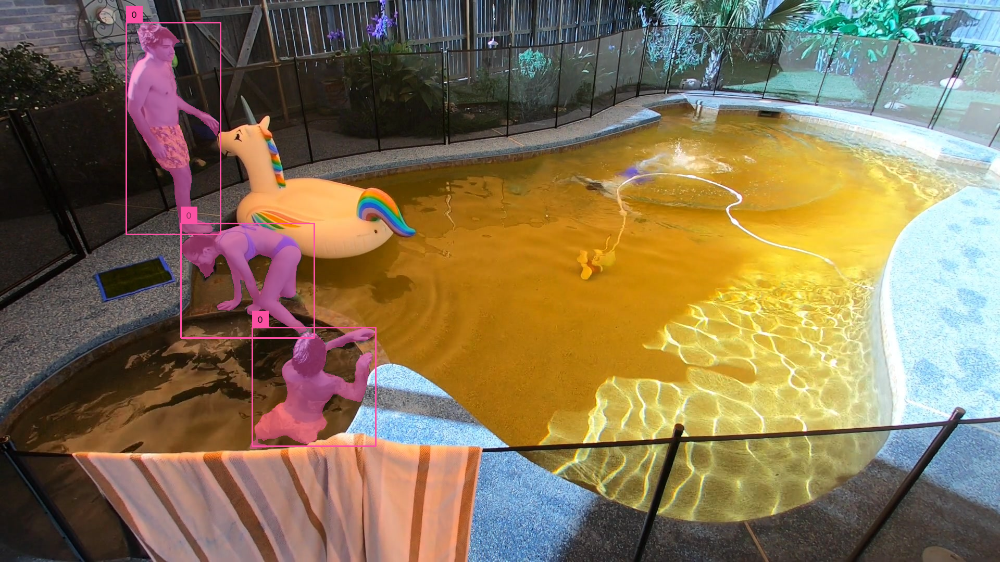

In [108]:
Image.fromarray(annotated_image)